# Summary of Bayesian Optimization Visualization and Processing Workflow

This notebook demonstrates a complete workflow for analyzing and visualizing the impact of Bayesian optimization on TVE-layer configurations and model hyperparameters across multiple machine learning algorithms (KNN, SVM, RF, MLP). The core steps are as follows:

---
##    **1. Bayesian Optimization Visualization**
### **1.1 Data Preprocessing with `BayesianModelOptimizerCSVProcessor`**
- Each model's CSV file is loaded from a specified path.
- The `.process()` method computes complexity and reformats each file.
- The first 10 rows of the KNN results are displayed with centered styling.
- Index is hidden for cleaner visualization in interactive environments.



In [1]:
from BayesianCV import BayesianModelOptimizerCSVProcessor
import pandas as pd
import matplotlib

# Assuming knn_processed is the DataFrame you want to format
knn_path = './checkpoints/BayesianResult/bayesian_knn.csv'
knn_processor = BayesianModelOptimizerCSVProcessor(knn_path)

# Process the file and compute the complexity
knn_processed = knn_processor.process()

# Set infinite width for columns (removes column width limit)
pd.set_option('display.max_colwidth', None)

# Set the header to be center-aligned
pd.set_option('display.colheader_justify', 'center')

# Display only the first 5 rows of the DataFrame
knn_processed_head = knn_processed.head(10)

# Apply styling to center-align both data cells and header cells
knn_processed_styled = knn_processed_head.style.set_properties(**{'text-align': 'center'}) \
    .set_table_styles([
        {
            'selector': 'td, th',  # Apply to both table data and headers
            'props': [('white-space', 'nowrap'), ('text-align', 'center')]  # Prevent wrapping and center-align text
        }
    ])

# Hide the index in the displayed output
knn_processed_styled.hide(axis="index")

# To view the styled DataFrame in Jupyter or other interactive environments
knn_processed_styled


model,TVE-layers,10-fold CV R²,10-fold CV MSE,leaf_size,n_neighbors,p,complexity,filename,params
KNN,1,0.460550,0.539381,26.680900,14.686200,1.000100,0.379150,encodedOutputLayer1.csv,"{'leaf_size': 26.68088018810296, 'n_neighbors': 14.686165375401004, 'p': 1.0001143748173449}"
KNN,1,0.398707,0.601122,22.093300,3.788400,1.092300,0.180463,encodedOutputLayer1.csv,"{'leaf_size': 22.09330290527359, 'n_neighbors': 3.7883619255251477, 'p': 1.0923385947687978}"
KNN,1,0.452284,0.547563,17.450400,7.565700,1.396800,0.309541,encodedOutputLayer1.csv,"{'leaf_size': 17.450408455106835, 'n_neighbors': 7.5656538138179075, 'p': 1.39676747423067}"
KNN,1,0.456829,0.543104,31.552700,8.964700,1.685200,0.547737,encodedOutputLayer1.csv,"{'leaf_size': 31.552669360134278, 'n_neighbors': 8.964695773662601, 'p': 1.6852195003967596}"
KNN,1,0.459165,0.540805,18.178100,17.684200,1.027400,0.369989,encodedOutputLayer1.csv,"{'leaf_size': 18.178089989260698, 'n_neighbors': 17.684231291427963, 'p': 1.0273875931979262}"
KNN,1,0.460550,0.539381,26.485300,14.675900,1.160300,0.430739,encodedOutputLayer1.csv,"{'leaf_size': 26.48530532973372, 'n_neighbors': 14.675891779172774, 'p': 1.1602520499547841}"
KNN,1,0.457354,0.542535,12.908800,12.514300,1.725400,0.468045,encodedOutputLayer1.csv,"{'leaf_size': 12.908751545574946, 'n_neighbors': 12.514254786415679, 'p': 1.7254450189134412}"
KNN,1,0.448212,0.551671,34.856100,16.228400,2.000000,0.807632,encodedOutputLayer1.csv,"{'leaf_size': 34.85612091448181, 'n_neighbors': 16.228420632891613, 'p': 2.0}"
KNN,1,0.454893,0.545072,24.390400,19.977200,1.939400,0.765987,encodedOutputLayer1.csv,"{'leaf_size': 24.390368364172332, 'n_neighbors': 19.977204991439358, 'p': 1.9393968222075604}"
KNN,1,0.447968,0.551894,10.001500,6.052000,1.976400,0.414111,encodedOutputLayer1.csv,"{'leaf_size': 10.001456724624337, 'n_neighbors': 6.05199557348266, 'p': 1.9763622266084973}"


---
### **1.2. Consolidation of Processed Results**
- Four processed DataFrames are stored in a list with associated model names.
- Each DataFrame is filtered to keep:  
  `'10-fold CV R²'`, `'10-fold CV MSE'`, `'TVE-layers'`, `'model'`, and `'complexity'`.
- All are concatenated into a unified DataFrame `bayesian_data`.
- A new column `'model_int'` maps model names to integers for plotting:
  - KNN → 1  
  - SVM → 2  
  - RF  → 3  
  - MLP → 4


In [2]:
rf_path = './checkpoints/BayesianResult/bayesian_rf.csv'
rf_processor = BayesianModelOptimizerCSVProcessor(rf_path)

# Process the file and compute the complexity
rf_processed = rf_processor.process()

In [3]:
svm_path = './checkpoints/BayesianResult/bayesian_svm.csv'
svm_processor = BayesianModelOptimizerCSVProcessor(svm_path)

# Process the file and compute the complexity
svm_processed = svm_processor.process()

In [4]:
mlp_path = './checkpoints/BayesianResult/bayesian_mlp.csv'
mlp_processor = BayesianModelOptimizerCSVProcessor(mlp_path)

# Process the file and compute the complexity
mlp_processed = mlp_processor.process()

In [5]:
# List of models with their respective DataFrames and names
model_dfs = [
    (knn_processed, 'KNN'),
    (rf_processed, 'RF'),
    (svm_processed, 'SVM'),
    (mlp_processed, 'MLP')
]

# Extract the relevant columns and add a 'model' column for each model's DataFrame
bayesian_data = pd.concat(
    [
        df[['10-fold CV R²', '10-fold CV MSE', 'TVE-layers', 'model', 'complexity']].assign(model=model_name)
        for df, model_name in model_dfs
    ],
    axis=0,
    ignore_index=True
)

# Display the final combined DataFrame
bayesian_data

,10-fold CV R²,10-fold CV MSE,TVE-layers,model,complexity
0,0.460550,0.539381,1,KNN,0.379150
1,0.398707,0.601122,1,KNN,0.180463
2,0.452284,0.547563,1,KNN,0.309541
3,0.456829,0.543104,1,KNN,0.547737
4,0.459165,0.540805,1,KNN,0.369989
...,...,...,...,...,...
955,0.798883,0.201106,8,MLP,0.133103
956,0.813113,0.186821,8,MLP,0.322312
957,0.807106,0.192895,8,MLP,0.107018
958,0.816889,0.183091,8,MLP,0.252884


---
### **1.3. Visualization Parameters**
- Fonts: Times New Roman, STIX math font.
- Matplotlib style and size settings for publication-quality figures.
- `cmasher` color maps: `cosmic_r` for smoother gradients of complexity.


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.animation import FuncAnimation
import cmasher as cmr

plt.rcParams['mathtext.fontset'] = 'stix' 
plt.rcParams['font.family']      = 'serif'    
plt.rcParams['font.serif']       = ['Times New Roman']
plt.rcParams['font.family']      = 'serif'
plt.rcParams['font.serif']       = ['Times New Roman']
plt.rcParams['axes.titlesize']   = 15 
plt.rcParams['axes.labelsize']   = 14 
plt.rcParams['xtick.labelsize']  = 15 
plt.rcParams['ytick.labelsize']  = 15 
plt.rcParams['legend.fontsize']  = 13 

cmap1 = cmr.cosmic_r
cmap2 = cmr.cosmic

---

### **1.4. 3D Rotating Plot: 10-fold CV R²**
- `Axes3D` used for 3D scatter plot:  
  - x-axis: TVE-layers  
  - y-axis: Model (as integer)  
  - z-axis: 10-fold CV R²  
  - color: Model complexity
- Custom y-ticks replaced integer codes with actual model names.
- Rotation is handled by `FuncAnimation` over azimuthal angles.
- Saved as `r2_rotation.gif`.

In [7]:
# Map model names to integers
model_mapping = {'KNN': 1, 'SVM': 2, 'RF': 3, 'MLP': 4}

# Apply the mapping to the 'model' column in bayesian_data
bayesian_data['model_int'] = bayesian_data['model'].map(model_mapping)

# Set up the function to create rotating plots and save them as GIFs
def save_gif(fig, update_func, filename, frames=360, interval=100):
    ani = FuncAnimation(fig, update_func, frames=np.arange(0, frames), interval=interval, blit=False, repeat=True)
    ani.save(filename, writer='imagemagick', fps=30)

# --- Plot and Save the First GIF (10-fold CV R²) ---
# Create a new figure for the 10-fold CV R² plot
fig1 = plt.figure(figsize=(7, 6))
ax1 = fig1.add_subplot(111, projection='3d')

# Scatter plot for '10-fold CV R²'
sc1 = ax1.scatter(
    bayesian_data['TVE-layers'],                # x: TVE-layers
    bayesian_data['model_int'],                 # y: Model (converted to int)
    bayesian_data['10-fold CV R²'],             # z: 10-fold CV R²
    c=bayesian_data['complexity'],              # Color by complexity
    cmap=cmap1,                                 # Colormap for better contrast
    marker='o',                                 # Marker type
    s=40,                                       # Slightly larger marker size for visibility
    alpha=1                                     # Transparency for better color blending
)

# Add color bar for complexity in the first subplot
cbar1 = fig1.colorbar(sc1, ax=ax1, shrink=0.5, aspect=18, pad=0.15)  # Shrink the colorbar
cbar1.set_label('Complexity')

# Labels for the first subplot
ax1.set_xlabel('TVE-layers',labelpad=10)
ax1.set_ylabel('Model',labelpad=10)
ax1.set_zlabel('10-fold CV R²',labelpad=8)

# Customize the ticks on the y-axis to show model names instead of integers
ax1.set_yticks([1, 2, 3, 4])
ax1.set_yticklabels(['KNN', 'SVM', 'RF', 'MLP'])

# Define the update function for rotating the first subplot (R²) only
def update1(frame):
    ax1.view_init(elev=20., azim=frame)  # Rotate only the first subplot (10-fold CV R²)
    return sc1,  # Only return the scatter plot (not the colorbar)

# Save the GIF for the first subplot (10-fold CV R²)
save_gif(fig1, update1, './outputs/fig/r2_rotation.gif')
plt.close()

MovieWriter imagemagick unavailable; using Pillow instead.


---

### **1.5. 3D Rotating Plot: 10-fold CV MSE**
- Similar structure to the R² plot.
- z-axis is now 10-fold CV MSE.
- Saved as `mse_rotation.gif`.

In [8]:
# --- Plot and Save the Second GIF (10-fold CV MSE) ---
# Create a new figure for the 10-fold CV MSE plot
fig2 = plt.figure(figsize=(7, 6))
ax2 = fig2.add_subplot(111, projection='3d')

# Scatter plot for '10-fold CV MSE'
sc2 = ax2.scatter(
    bayesian_data['TVE-layers'],                # x: TVE-layers
    bayesian_data['model_int'],                 # y: Model (converted to int)
    bayesian_data['10-fold CV MSE'],            # z: 10-fold CV MSE
    c=bayesian_data['complexity'],              # Color by complexity
    cmap=cmap1,                                 # Colormap for better contrast
    marker='o',                                 # Marker type
    s=40,                                       # Slightly larger marker size for visibility
    alpha=1                                     # Transparency for better color blending
)

# Add color bar for complexity in the second subplot
cbar2 = fig2.colorbar(sc2, ax=ax2, shrink=0.5, aspect=18, pad=0.15)  # Shrink the colorbar
cbar2.set_label('Complexity')

# Labels for the second subplot
ax2.set_xlabel('TVE-layers', labelpad=10)
ax2.set_ylabel('Model', labelpad=10)
ax2.set_zlabel('10-fold CV MSE',labelpad=8)

# Customize the ticks on the y-axis to show model names instead of integers
ax2.set_yticks([1, 2, 3, 4])
ax2.set_yticklabels(['KNN', 'SVM', 'RF', 'MLP'])

# Define the update function for rotating the second subplot (MSE) only
def update2(frame):
    ax2.view_init(elev=20., azim=frame)  # Rotate only the second subplot (10-fold CV MSE)
    return sc2,  # Only return the scatter plot (not the colorbar)

# Save the GIF for the second subplot (10-fold CV MSE)
save_gif(fig2, update2, './outputs/fig/mse_rotation.gif')
plt.close()

MovieWriter imagemagick unavailable; using Pillow instead.


---

### **1.6. Web-style Dual GIF Display**
- HTML is used to render both GIFs side by side.
- A centered gradient title overlays the figures:
  - Title: "Visualization of TVE Layer and Downstream Hyperparameter Optimization Based on Bayesian Optimization"
- Custom fonts, position adjustments, and gradient styling enhance readability.

---

In [9]:
from IPython.display import display, HTML

# Create HTML content to display two GIF files side by side with a title overlay
html_code = """
<div style="position: relative; text-align: center; display: inline-block; width: 1450px; height: 600px;">
    <div style="display: flex; justify-content: center; gap: 0px;">
        <img src="./outputs/fig/r2_rotation.gif" width="1000" style="position: relative; top: 30px; left: 60px;" ; z-index: 2;" /> <!-- Absolute position for the first image -->
        <img src="./outputs/fig/mse_rotation.gif" width="1000" ; z-index: 1;" style="position: relative; top: 30px; left: 0px;" />
    </div>
    <h3 style="position: absolute; top: -50px; left: 50%; transform: translateX(-50%); font-size: 40px; background: linear-gradient(to bottom, #E3E3E3, white); padding: 10px; font-family: 'Dancing Script', cursive; width: 100%; box-sizing: border-box; line-height: 1.5;">
        Visualization of TVE Layer and Downstream Hyperparameter Optimization Based on Bayesian Optimization
    </h3>
    <h3 style="position: absolute; top: -50px; left: 50%; transform: translateX(-50%); font-size: 40px; 
        background: linear-gradient(to bottom, blue, black); 
        -webkit-background-clip: text; 
        background-clip: text; 
        color: transparent; 
        padding: 10px; 
        font-family: 'Dancing Script', cursi
        ve; 
        width: 100%; 
        box-sizing: border-box; 
        line-height: 1.5;">
        Visualization of TVE Layer and Downstream Hyperparameter Optimization Based on Bayesian Optimization
    </h3>
    <div style="position: absolute; top: 0; left: 0; right: 0; bottom: 5%; border: 2px dotted gray; pointer-events: none;"></div>  <!-- Dotted border at the bottom -->
</div>

<!-- Link to Google Fonts -->
<link href="https://fonts.googleapis.com/css2?family=Dancing+Script&display=swap" rel="stylesheet">
"""

# Display the HTML content
display(HTML(html_code))


## **2.Model Interpretation and Visualization Workflow**

This code demonstrates a comprehensive process for model evaluation and interpretation using Bayesian cross-validation, permutation feature importance, and SHAP analysis. It includes the following key stages:

---

### **2.1. Scatter Plot Generation for Model Predictions**
- **Module**: `ModelPlotter` from `BayesianCV`
- **Purpose**: Generate scatter plots of predicted vs. actual values across cross-validation folds.
- **Paths**:
  - Predictions: `./checkpoints/BayesianResult/ResultResNet/iteration_example/predictions_file/predictions_fold_{}.csv`
  - CV results: `./checkpoints/BayesianResult/ResultResNet/iteration_example/cross_validation_results/cv_results.csv`
  - Output folder: `./outputs/fig/scatter_ResNet/`


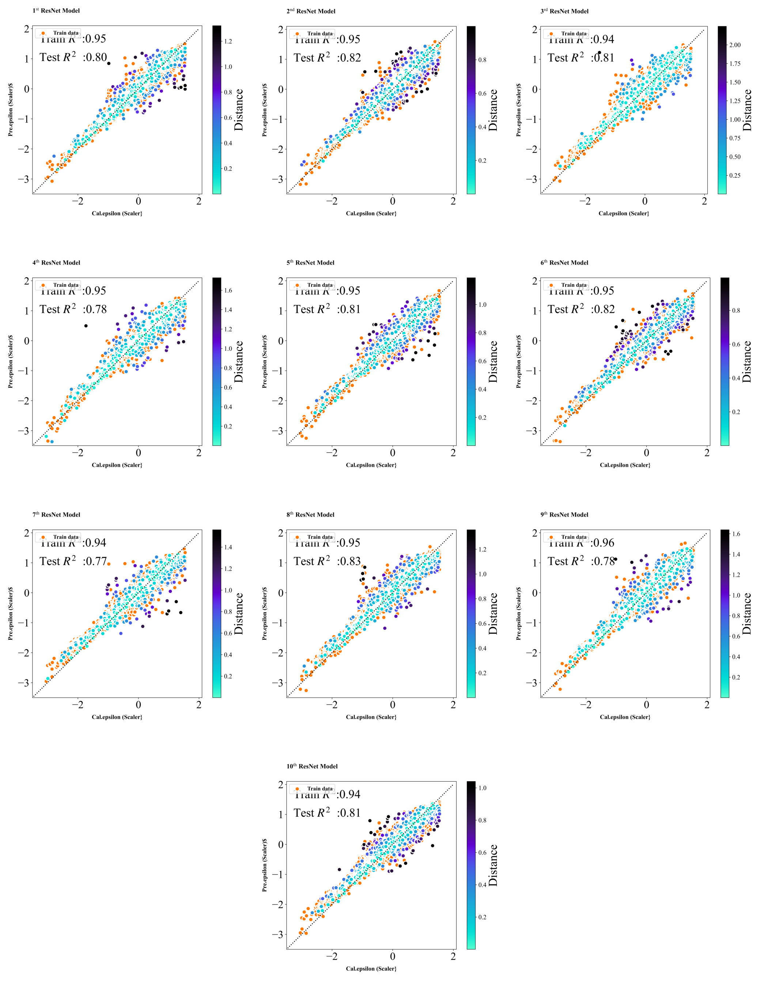

In [10]:
from BayesianCV import ModelPlotter
# Example usage
file_path_pattern = './checkpoints/BayesianResult/ResultResNet/iteration_example/predictions_file/predictions_fold_{}.csv'
cv_file_path = './checkpoints/BayesianResult/ResultResNet/iteration_example/cross_validation_results/cv_results.csv'
output_folder = './outputs/fig/scatter_ResNet/'

plotter = ModelPlotter(file_path_pattern, cv_file_path, output_folder)
plotter.plot_all_models()

---

###  **2.2. Permutation Importance Calculation and Visualization**
- **Module**: `PermutationImportancePlotter` from `FeatureImportance`
- **Purpose**: Evaluate and visualize feature importance by permutation method.
- **Inputs**:
  - Models: `./checkpoints/BayesianResult/ResultResNet/iteration_example/save_models`
  - Encoded features: `./outputs/encoded_features/encodedOutputLayerExample.csv`
  - Output directory: `./outputs/fig/PERM`
- **Process**:
  - Loop over 10 cross-validation folds
  - Display a progress bar in terminal
  - Save importance plots for each fold

In [11]:
import matplotlib.pyplot as plt
from matplotlib import gridspec
import sys
from PIL import Image
from FeatureImportance import PermutationImportancePlotter

plt.rcParams['font.family']      = 'serif'
plt.rcParams['font.serif']       = ['Times New Roman']
plt.rcParams['font.size']        = 14
plt.rcParams['axes.titlesize']   = 25
plt.rcParams['axes.labelsize']   = 12
plt.rcParams['xtick.labelsize']  = 15
plt.rcParams['ytick.labelsize']  = 20
plt.rcParams['legend.fontsize']  = 20
plt.rcParams['figure.titlesize'] = 18


model_dir = './checkpoints/BayesianResult/ResultResNet/iteration_example/save_models'
data_path = './outputs/encoded_features/encodedOutputLayerExample.csv'
results_dir = './outputs/fig/PERM'

# Initialize your plotter
plotter = PermutationImportancePlotter(model_dir, data_path, results_dir, config_file='PERMConfig.json')

# Total number of folds
total_folds = 10
progress_bar_length = 50  # Adjust the length of the progress bar

# Loop through folds 0 to 9 and plot each
for fold in range(total_folds):
    # Calculate the progress ratio
    progress = (fold + 1) / total_folds
    block_count = int(progress * progress_bar_length)

    # Create a progress bar
    progress_bar = f"[{'■' * block_count}{' ' * (progress_bar_length - block_count)}] {fold + 1}/{total_folds} completed"
    sys.stdout.write(f"\r{progress_bar}")
    sys.stdout.flush()

    # Plot the permutation importance for this fold
    plotter.plot_permutation_importance(skip_to_fold=fold)  # This already saves the image as a PNG
    plt.close()

[■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 10/10 completed

---

###  **2.3. Combining Permutation Plots into One Image**
- **Library**: `PIL.Image`
- **Process**:
  - Load all 10 PNG files
  - Create a blank canvas with 2 rows and 5 columns
  - Paste each image in order
  - Save as: `permutation_importance_0_to_9.png`

In [12]:
from PIL import Image

# Read the saved images
images = [Image.open(f"{results_dir}/perm_importances_plot_{i}.png") for i in range(total_folds)]

# Calculate the width and height of the combined image
max_width = max(image.width for image in images)
max_height = max(image.height for image in images)

# Calculate combined image dimensions: 5 images per row, 2 rows
combined_width = max_width * 5  # 5 images per row
combined_height = max_height * 2  # 2 rows

# Create a blank image to combine all subplots
combined_image = Image.new('RGB', (combined_width, combined_height))

# Paste each image into the final combined image
x_offset = 0
y_offset = 0
for i, image in enumerate(images):
    combined_image.paste(image, (x_offset, y_offset))
    if (i + 1) % 5 == 0:  # After every 5 images, move to the next row
        y_offset += image.height
        x_offset = 0
    else:
        x_offset += image.width

# Save the final combined image with high quality
combined_image.save(f"{results_dir}/permutation_importance_0_to_9.png", quality=100)

# Final output after completion
print("\nAll folds completed!")
combined_image


All folds completed!


---

###  **2.4. SHAP Value Calculation**
- **Module**: `SHAPFeatureImportance` from `FeatureImportance`
- **Purpose**: Compute SHAP values for feature-level model interpretation
- **Paths**:
  - Model directory: `./checkpoints/BayesianResult/ResultResNet/iteration_example/save_models`
  - Data file: `./outputs/encoded_features/encodedOutputLayerExample.csv`
- **Execution**:
  - Instantiate SHAP calculator with a seed for reproducibility
  - Run `.run()` to compute SHAP values

In [13]:
from FeatureImportance import SHAPFeatureImportance

# Set paths
model_dir = './checkpoints/BayesianResult/ResultResNet/iteration_example/save_models'
data_file = "./outputs/encoded_features/encodedOutputLayerExample.csv"

# Create class instance and run the process
shap_calc = SHAPFeatureImportance(model_dir, data_file, seed_value=1)
shap_calc.run()

1. Processing fold 1...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_1_fold.csv
2. Processing fold 2...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_2_fold.csv
3. Processing fold 3...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_3_fold.csv
4. Processing fold 4...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_4_fold.csv
5. Processing fold 5...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_5_fold.csv
6. Processing fold 6...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_6_fold.csv
7. Processing fold 7...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_7_fold.csv
8. Processing fold 8...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_8_fold.csv
9. Processing fold 9...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_9_fold.csv
10. Processing fold 10...


  0%|          | 0/300 [00:00<?, ?it/s]

    ✔ SHAP values saved to ./outputs/fig/SHAP/shap_values_10_fold.csv


---

## 5. **SHAP Plot Rotation and Arrangement**
- **Purpose**: Visually enhance SHAP plots by trimming whitespace and rotating images for horizontal layout
- **Function**: `rotate_and_arrange_plots`
- **Parameters**:
  - SHAP calculator instance
  - Output directory for SHAP plots: `./outputs/fig/SHAP`
  - Number of top features per fold: 5
- **Visualization**:
  - Arrange SHAP plots (folds 1–10) in 2 rows × 5 columns
  - Rotate each image 90° counterclockwise for uniformity
  - Use `matplotlib` and `PIL` for display and preprocessing

SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_1.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_2.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_3.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_4.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_5.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_6.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_7.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_8.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_9.png
SHAP summary plot saved to ./outputs/fig/SHAP/shap_summary_fold_10.png


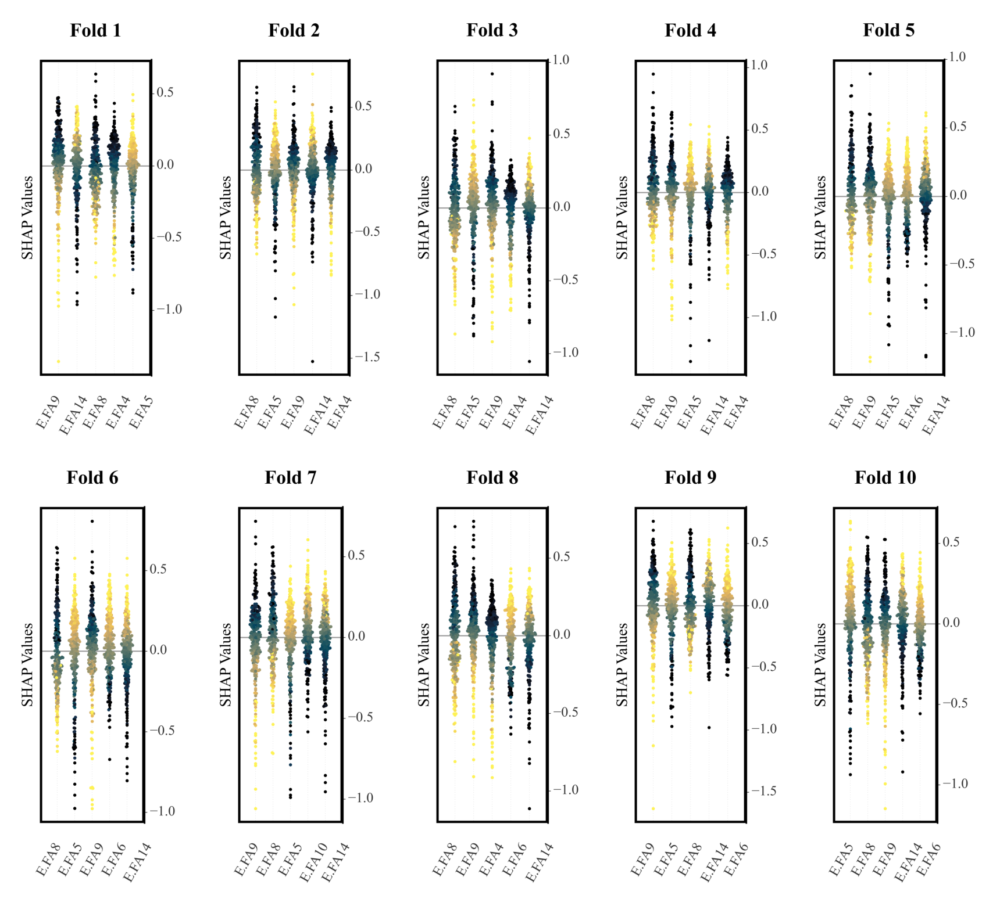

In [14]:
from FeatureImportance import SHAPFeatureImportance
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['font.size'] = 18
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['figure.titlesize'] = 20

def rotate_and_arrange_plots(shap_calc, shap_values_dir, num_top_features=5):
    # Create a list to store the file paths of individual SHAP plots
    plot_files = []

    # Generate SHAP plots for the first 10 features
    for i in range(10):
        shap_calc.plot_shap_summary(i, num_top_features=num_top_features, shap_values_dir=shap_values_dir)
        plot_files.append(f'{shap_values_dir}/shap_summary_fold_{i + 1}.png')
        plt.close()

    # Set up the figure for 2 rows and 5 columns of subplots
    fig, axes = plt.subplots(2, 5, figsize=(22, 20))

    for i, ax in enumerate(axes.flat):
        # Load the generated plot image
        img = mpimg.imread(plot_files[i])

        # Convert to PIL Image to trim the white space
        pil_img = Image.fromarray((img * 255).astype(np.uint8))  # Convert to 8-bit format for trimming
        pil_img = pil_img.convert("RGB")

        # Trim white borders using the crop method
        bbox = pil_img.getbbox()  # Get bounding box of non-white regions
        trimmed_img = pil_img.crop(bbox)

        # Rotate the image 90 degrees counterclockwise
        rotated_img = np.array(trimmed_img.rotate(90, expand=True))

        # Display the rotated image
        ax.imshow(rotated_img)
        ax.axis('off')  # Turn off axis for better visual appearance

    # Adjust layout for minimal spacing and no overlap
    plt.subplots_adjust(hspace=0, wspace=0)
    plt.show()

# Set the paths for your model directory and data file
model_dir = './checkpoints/BayesianResult/ResultResNet/iteration_example/save_models'
data_file = "./outputs/encoded_features/encodedOutputLayerExample.csv"

# Create the SHAPFeatureImportance object
shap_calc = SHAPFeatureImportance(model_dir, data_file, seed_value=1)

# Call the function to rotate and arrange the plots
rotate_and_arrange_plots(shap_calc, shap_values_dir='./outputs/fig/SHAP')

# 📊 **Summary: Bayesian Optimization & Model Interpretation Workflow**

This workflow integrates **Bayesian optimization**, **visual analytics**, and **model interpretation** across multiple machine learning models (KNN, SVM, RF, MLP). It is divided into two major components:

### 🔧 **Bayesian Optimization & Visualization**
- Process and clean results using `BayesianModelOptimizerCSVProcessor`.
- Concatenate filtered metrics (`R²`, `MSE`, TVE-layers, model type, complexity).
- Visualize in 3D rotating plots:
   - `R²` and `MSE` vs. TVE-layers and model (with complexity as color).
   - Animated using `FuncAnimation`, exported as `.gif`.
- Styled using `matplotlib`, `cmasher`, and custom fonts.
- Dual-GIF web-style HTML display with gradient title for publication-ready visuals.

---

### 🧠 **Model Interpretation & Explainability**
- **Prediction Scatter**: Compare predicted vs. actual values across CV folds (`ModelPlotter`).
- **Permutation Importance**: Visualize top feature importances across 10 folds using `PermutationImportancePlotter`; compile into a 2×5 grid.
- **SHAP Analysis**: Compute and visualize SHAP values (`SHAPFeatureImportance`):
  - Rotate and arrange SHAP plots for consistent layout.
  - Highlight top 5 features per fold.

---

✅ This complete pipeline ensures robust model evaluation, hyperparameter analysis, and transparent feature interpretation, suitable for both research and deployment.
